In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def init_grid(width, height, n_states):
    return np.random.randint(0, n_states, (height, width))

def update(frame, img, grid, n_states, threshold):
    """
    Update the grid based on the Cyclic Cellular Automaton rules.
    Rule: A cell with state S advances to (S + 1) % N if it has 
    at least 'threshold' neighbors with state (S + 1) % N.
    """
    height, width = grid.shape
    next_grid = grid.copy()
    target_state = (grid + 1) % n_states
    neighbor_match_count = np.zeros_like(grid)
    for dy in [-1, 0, 1]:
        for dx in [-1, 0, 1]:
            if dx == 0 and dy == 0:
                continue
            
            shifted = np.roll(grid, shift=(dy, dx), axis=(0, 1))
            
            # Check if the neighbor matches the target state
            neighbor_match_count += (shifted == target_state)
    
    mask = neighbor_match_count >= threshold
    next_grid[mask] = target_state[mask]
    
    grid[:] = next_grid[:]
    img.set_array(grid)
    return img,

#Parameters
WIDTH = 200
HEIGHT = 200
N_STATES = 20  #Number of colors
THRESHOLD = 1   # Neighbors needed to advance state
FRAMES = 200   # Total animation frames
INTERVAL = 50  # Speed (ms between frames)

grid = init_grid(WIDTH, HEIGHT, N_STATES)
fig, ax = plt.subplots(figsize=(6, 6))
img = ax.imshow(grid, cmap='nipy_spectral', interpolation='nearest')
ax.axis('off')

#Animation
anim = FuncAnimation(
    fig, 
    update, 
    fargs=(img, grid, N_STATES, THRESHOLD), 
    frames=FRAMES, 
    interval=INTERVAL, 
    blit=True
)
plt.close()
HTML(anim.to_jshtml())

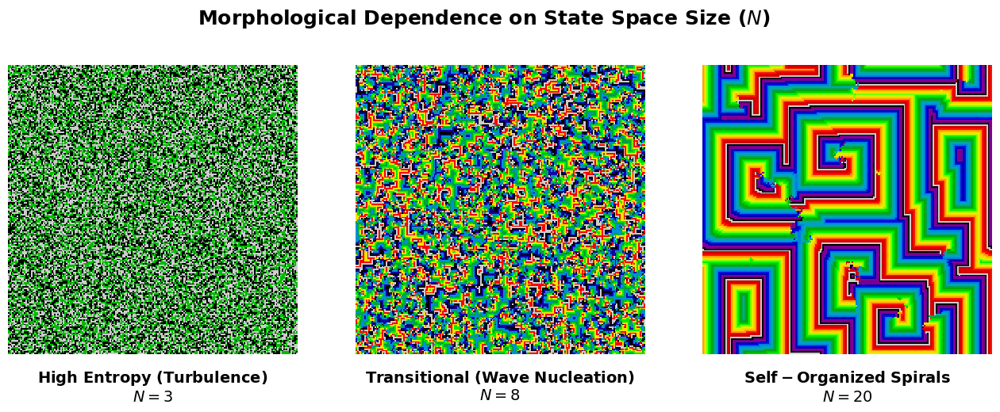

In [7]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(34)

def generate_cca_grid(n_states, width=200, height=200, threshold=1, steps=300):
    grid = np.random.randint(0, n_states, (height, width))
    for _ in range(steps):
        target_state = (grid + 1) % n_states
        neighbor_matches = np.zeros_like(grid)     
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if dx == 0 and dy == 0: 
                    continue
                shifted = np.roll(grid, shift=(dy, dx), axis=(0, 1))
                neighbor_matches += (shifted == target_state)  
        mask = neighbor_matches >= threshold
        grid[mask] = target_state[mask]
        
    return grid

configs = [
    (3, r"$\bf{High\ Entropy\ (Turbulence)}$" + "\n" + r"$N=3$"),
    (8, r"$\bf{Transitional\ (Wave\ Nucleation)}$" + "\n" + r"$N=8$"),
    (20, r"$\bf{Self-Organized\ Spirals}$" + "\n" + r"$N=20$")
]

fig, axes = plt.subplots(1, 3, figsize=(16, 6))
plt.subplots_adjust(bottom=0.2, top=0.85)

for i, (n, title) in enumerate(configs):
    result = generate_cca_grid(n)
    
    axes[i].imshow(result, cmap='nipy_spectral', interpolation='nearest')
    axes[i].text(0.5, -0.05, title, 
                 transform=axes[i].transAxes, 
                 ha='center', 
                 va='top', 
                 fontsize=14, 
                 color='black')
    
    axes[i].axis('off')

plt.suptitle("Morphological Dependence on State Space Size ($N$)", fontsize=18, fontweight='bold', y=0.95)
plt.savefig("cca_phase_transition_bottom_labels.png", dpi=300, bbox_inches='tight')
plt.show()